# Objective

**Flow cell: P02-006**

Look at flow cell "dirtiness" (i.e., how badly the background is contaminated by those small bright specks that build up) over time.

Include images with aberrations.

# Contents

This notebook calculates and shows image dirtiness over time.

For each image, the "dirtiness" is the sum of the binarized image with two bandpass filters to remove the "ghosts" divided by the image's total valid area.

Below the dirtiness vs. time plots, I've kept the examples of high dirtiness images (the outliers which were omitted from the plots) and normal dirtiness images.

Plot info:
- images with aberrations are included
- the y axis shows timestamp rather than run count
- historical event timepoints are shown
- average dirtiness over time is plotted
- one version has the datapoints connected; another has the datapoints as individual markers so it's easier to see when the different runs happened

Below these plots are the images identified as having aberrations and example images not identified as having aberrations.

# Conclusions

Compared with the plot between January and May 2022, the dirtiness level for this new dataset is a lot lower and generally hovers around 0.0005, which is around the lowest dirtiness level shown on the plot between January and May 2022.

In [1]:
from skimage.io import imread, imsave
from skimage.util import img_as_float
from skimage.filters import difference_of_gaussians, threshold_otsu
from skimage.segmentation import expand_labels
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import math, os, skimage, warnings
from datetime import datetime
warnings.filterwarnings('ignore')

In [2]:
# for preparing the image before getting dirtiness
def crop_center(img,cropx,cropy):
    y,x = img.shape
    startx = x//2-(cropx//2)
    starty = y//2-(cropy//2)
    return img[starty:starty+cropy,startx:startx+cropx]

In [3]:
def get_dirtiness(img, save_cropped_image, save_processed_image):
        
    filtered1_image = difference_of_gaussians(img, sig_min, sig_max1)
    filtered2_image = difference_of_gaussians(filtered1_image, sig_min, sig_max2)
    filtered2_image[filtered2_image < 0.] = 0.
    filtered2_binary = filtered2_image > binarization_threshold     

    if save_cropped_image:
        imsave(path_cropped, img)
    if save_processed_image:
        imsave(path_processed, filtered2_binary)

    dirtiness = np.sum(filtered2_binary)/filtered2_binary.size

    if dirtiness > high_dirtiness_thresh:
        
        aberrations = True

        # Select bright features
        feature_mask = img > bright_thresh
        labeled = skimage.measure.label(feature_mask)

        # Exclude small regions
        for props in skimage.measure.regionprops(labeled):
            if props.area < labeled.size * size_thresh:
                feature_mask[labeled == props.label] = 0

        # Grow
        grow_px = img.shape[0] * grow_factor
        for i in range(grow_cycles):
            feature_mask = skimage.segmentation.expand_labels(feature_mask,
                                                              grow_px)

        # Fill in hollow regions
        labeled = skimage.measure.label(~feature_mask)
        propses = skimage.measure.regionprops(labeled)
        areas = [(props.area, props.label) for props in propses]
        areas.sort()
        areas.pop()
        for area, label in areas:
            feature_mask[labeled == label] = 1

        # Also mask out undefined areas due to image alignment
        feature_mask[np.isnan(img)] = 1

        # Get binarized image with dirt
        filtered1_image = difference_of_gaussians(img, sig_min, sig_max1)
        filtered2_image = difference_of_gaussians(filtered1_image, sig_min, sig_max2)
        filtered2_image[filtered2_image < 0.] = 0.
        filtered2_binary = filtered2_image > binarization_threshold

        # Apply mask to identify dirty area in valid region
        valid_region = np.logical_not(feature_mask)
        dirty_area_in_valid_region = np.logical_and(filtered2_binary, valid_region)
        dirtiness = np.sum(dirty_area_in_valid_region)/np.sum(valid_region)
    
    else:
        aberrations = False
        
    return dirtiness, aberrations

In [4]:
# for plotting results
def get_ts(xs):
    ts = []
    for name in xs:
        tokens = name.split('-')
        year = int(tokens[1][:4])
        month = int(tokens[1][4:6])
        day = int(tokens[1][6:8])
        hours = int(tokens[2][:2])
        minutes = int(tokens[2][2:4])
        seconds = int(tokens[2][4:])
        dtime = datetime(year, month, day, hours, minutes, seconds)
        ts.append(dtime)
    return ts

In [5]:
cropx, cropy = 1448, 1448
sig_min = 1
sig_max1 = 12
sig_max2 = 3

base_dir = '2022-08-19_p02-006_bgs'
cols = ['image_name',
        'run_no',
        'lane_no',
        'binarization_threshold',
        'sum_bin_filtered2']

save_cropped_image, save_processed_image = True, True

# params for deciding whether image has aberration
high_dirtiness_thresh = 0.004

# params for producing mask
grow_factor = 0.0375
bright_thresh = 14000
size_thresh = 3e-3 # was 3e-4
grow_cycles = 1

# params for getting image with dirt
binarization_threshold = 0.05

In [6]:
fnames = sorted(os.listdir(base_dir))

In [7]:
dirtinesses = {i: [] for i in range(8)}

fnames_w_aberrations, fnames_wout_aberrations = [], []

for i, fname in enumerate(fnames):
    
    if fname[-6]!='-':
        continue
        
    print(fname, '\t%d/%d' % (i, len(fnames)))
    path = '%s/%s' % (base_dir, fname)
    path_cropped = '%s/%s_cropped.tif' % (base_dir, fname[:-4])
    path_processed = '%s/%s_processed.tif' % (base_dir, fname[:-4])

    image = imread(path)
    image_cropped = crop_center(image,cropx,cropy)
    dirtiness, aberrations = get_dirtiness(image_cropped, save_cropped_image, save_processed_image)
    if aberrations:
        fnames_w_aberrations.append(fname)
    else:
        fnames_wout_aberrations.append(fname)
    
    lane_no = int(fname.rsplit(".", 1)[0].rsplit("-", 1)[-1])

    dirtinesses[lane_no].append((fname, dirtiness))
    print('\t%s\tdirtiness = %f' % (fname, dirtiness))


background-20220616-183828-0.tif 	0/803
	background-20220616-183828-0.tif	dirtiness = 0.000101
background-20220616-183828-1.tif 	5/803
	background-20220616-183828-1.tif	dirtiness = 0.002011
background-20220616-183828-2.tif 	8/803
	background-20220616-183828-2.tif	dirtiness = 0.000389
background-20220616-183828-3.tif 	11/803
	background-20220616-183828-3.tif	dirtiness = 0.000310
background-20220616-183828-4.tif 	14/803
	background-20220616-183828-4.tif	dirtiness = 0.000091
background-20220616-183828-5.tif 	17/803
	background-20220616-183828-5.tif	dirtiness = 0.001027
background-20220616-183828-6.tif 	20/803
	background-20220616-183828-6.tif	dirtiness = 0.000193
background-20220616-183828-7.tif 	23/803
	background-20220616-183828-7.tif	dirtiness = 0.000276
background-20220621-084456-0.tif 	26/803
	background-20220621-084456-0.tif	dirtiness = 0.000093
background-20220621-084456-1.tif 	29/803
	background-20220621-084456-1.tif	dirtiness = 0.000428
background-20220621-084456-2.tif 	32/803
	b

	background-20220624-165148-5.tif	dirtiness = 0.000313
background-20220624-165148-6.tif 	260/803
	background-20220624-165148-6.tif	dirtiness = 0.000591
background-20220624-165148-7.tif 	263/803
	background-20220624-165148-7.tif	dirtiness = 0.001248
background-20220624-191033-0.tif 	266/803
	background-20220624-191033-0.tif	dirtiness = 0.000265
background-20220624-191033-1.tif 	269/803
	background-20220624-191033-1.tif	dirtiness = 0.000140
background-20220624-191033-2.tif 	272/803
	background-20220624-191033-2.tif	dirtiness = 0.000061
background-20220624-191033-3.tif 	275/803
	background-20220624-191033-3.tif	dirtiness = 0.000107
background-20220624-191033-4.tif 	278/803
	background-20220624-191033-4.tif	dirtiness = 0.000290
background-20220624-191033-5.tif 	281/803
	background-20220624-191033-5.tif	dirtiness = 0.000320
background-20220624-191033-6.tif 	284/803
	background-20220624-191033-6.tif	dirtiness = 0.000689
background-20220624-191033-7.tif 	287/803
	background-20220624-191033-7.

	background-20220728-121604-2.tif	dirtiness = 0.000309
background-20220728-121604-3.tif 	515/803
	background-20220728-121604-3.tif	dirtiness = 0.000146
background-20220728-121604-4.tif 	518/803
	background-20220728-121604-4.tif	dirtiness = 0.000601
background-20220728-123402-0.tif 	521/803
	background-20220728-123402-0.tif	dirtiness = 0.000330
background-20220728-123402-1.tif 	524/803
	background-20220728-123402-1.tif	dirtiness = 0.000195
background-20220728-123402-2.tif 	527/803
	background-20220728-123402-2.tif	dirtiness = 0.000317
background-20220728-123402-3.tif 	530/803
	background-20220728-123402-3.tif	dirtiness = 0.000152
background-20220728-123402-4.tif 	533/803
	background-20220728-123402-4.tif	dirtiness = 0.000596
background-20220728-130207-0.tif 	536/803
	background-20220728-130207-0.tif	dirtiness = 0.000312
background-20220728-130207-1.tif 	539/803
	background-20220728-130207-1.tif	dirtiness = 0.000152
background-20220728-130207-2.tif 	542/803
	background-20220728-130207-2.

	background-20220816-115041-1.tif	dirtiness = 0.000219
background-20220816-115041-2.tif 	770/803
	background-20220816-115041-2.tif	dirtiness = 0.000280
background-20220816-115041-3.tif 	773/803
	background-20220816-115041-3.tif	dirtiness = 0.000148
background-20220816-115041-4.tif 	776/803
	background-20220816-115041-4.tif	dirtiness = 0.000557
background-20220816-122708-0.tif 	779/803
	background-20220816-122708-0.tif	dirtiness = 0.000186
background-20220816-122708-1.tif 	782/803
	background-20220816-122708-1.tif	dirtiness = 0.000226
background-20220816-122708-2.tif 	785/803
	background-20220816-122708-2.tif	dirtiness = 0.000266
background-20220816-122708-3.tif 	788/803
	background-20220816-122708-3.tif	dirtiness = 0.000146
background-20220816-122708-4.tif 	791/803
	background-20220816-122708-4.tif	dirtiness = 0.000438
background-20220816-122708-5.tif 	794/803
	background-20220816-122708-5.tif	dirtiness = 0.000368
background-20220816-122708-6.tif 	797/803
	background-20220816-122708-6.

# Plot

In [8]:
fs = 14
event_label_height = 0.0035

# events = {
#     'CCI becomes out-of-focus': datetime(2022, 3, 9),
#     'Start using FlowClean': datetime(2022, 2, 23),
#     'CCI stops being out-of-focus': datetime(2022, 3, 28),
#     'Switched from FlowClean to 10% Contrad 70': datetime(2022, 4, 8),
#     'Soaked overnight with 10% Contrad 70': datetime(2022, 4, 19)
# }

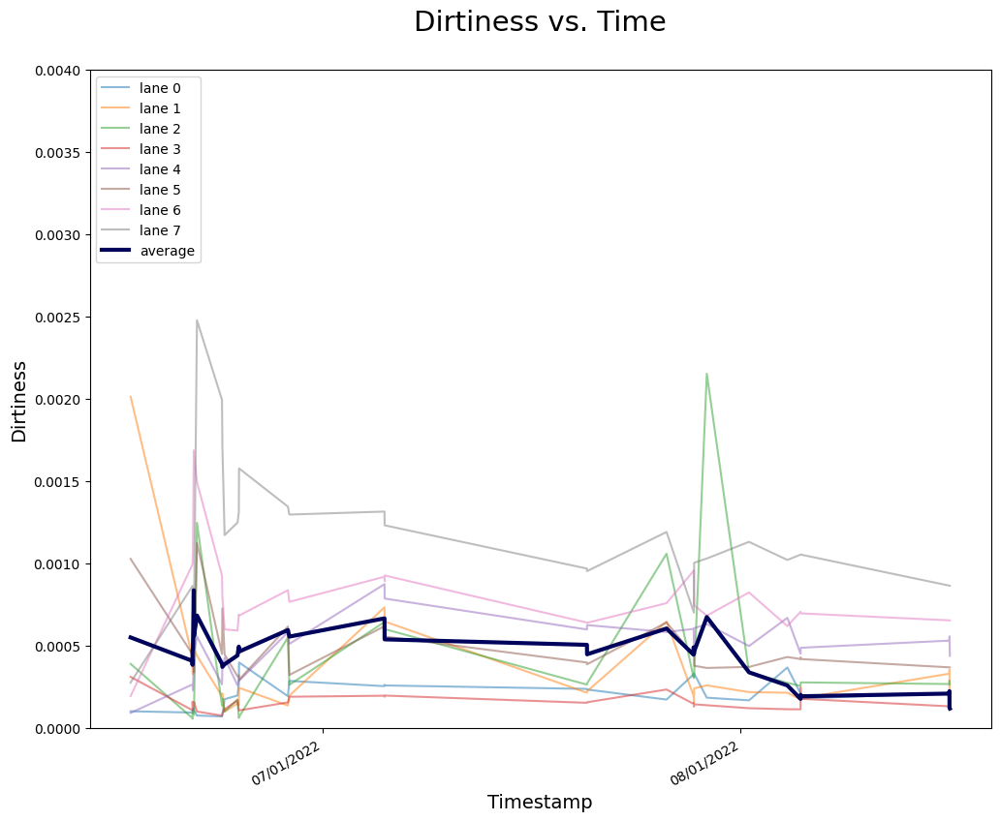

In [9]:
plt.figure(figsize=(12.,10.), dpi=100)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%m/%d/%Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))

# plot each lane separately
for lane_no, rows in dirtinesses.items():
    if not rows:
        continue
    xs, ys = zip(*rows)
    ts = get_ts(xs)
    plt.plot(ts, ys, label=f"lane {lane_no}", alpha=0.5)

# plot averages across lanes
dirtiness_avgs = []
for run_no in range(len(dirtinesses[0])): # len(dirtinesses[0]) = 37
    dirtiness_sum = 0
    num_lanes = 8
    for lane_no in range(num_lanes):
        try:
            dirtiness_sum += dirtinesses[lane_no][run_no][1]
        except:
            num_lanes = lane_no
    dirtiness_avg = dirtiness_sum/num_lanes
    dirtiness_avgs.append(dirtiness_avg)
ts = get_ts([row[0] for row in dirtinesses[0]])
plt.plot(ts, dirtiness_avgs, label="average", lw=3, color='xkcd:dark blue')

# # plot events
# for event_name in events:
#     event_date = events[event_name]
#     plt.axvline(x=event_date, color='gray', ls='--')
#     plt.text(event_date, event_label_height, event_name, rotation=40, backgroundcolor='xkcd:light yellow')
    
plt.gcf().autofmt_xdate()
plt.xlabel('Timestamp', fontsize=fs)
plt.ylabel('Dirtiness', fontsize=fs)
plt.ylim(0, high_dirtiness_thresh)
plt.title('Dirtiness vs. Time\n', fontsize=fs*1.5)
plt.legend(loc='upper left')
plt.show()

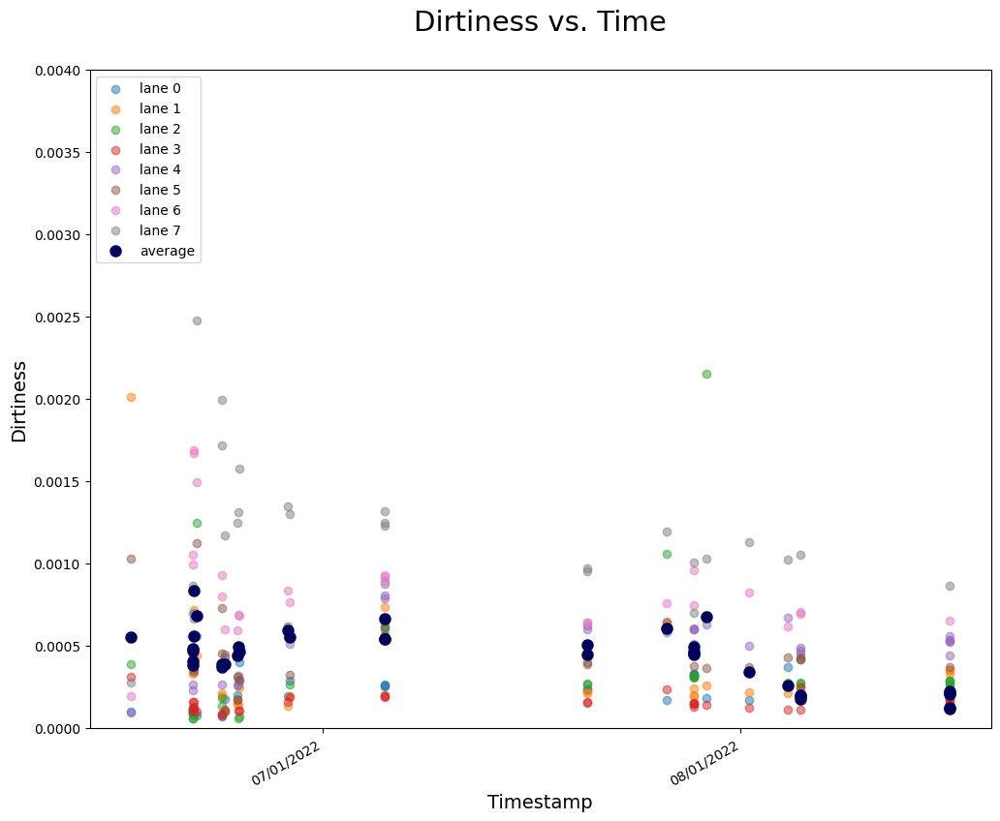

In [10]:
plt.figure(figsize=(12.,10.), dpi=100)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%m/%d/%Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))

# plot each lane separately
for lane_no, rows in dirtinesses.items():
    if not rows:
        continue
    xs, ys = zip(*rows)
    ts = get_ts(xs)
    plt.scatter(ts, ys, label=f"lane {lane_no}", alpha=0.5)

# plot averages across lanes
dirtiness_avgs = []
for run_no in range(len(dirtinesses[0])): # len(dirtinesses[0]) = 37
    dirtiness_sum = 0
    num_lanes = 8
    for lane_no in range(num_lanes):
        try:
            dirtiness_sum += dirtinesses[lane_no][run_no][1]
        except:
            num_lanes = lane_no
    dirtiness_avg = dirtiness_sum/num_lanes
    dirtiness_avgs.append(dirtiness_avg)
ts = get_ts([row[0] for row in dirtinesses[0]])
plt.scatter(ts, dirtiness_avgs, label="average", lw=3, color='xkcd:dark blue')

# # plot events
# for event_name in events:
#     event_date = events[event_name]
#     plt.axvline(x=event_date, color='gray', ls='--')
#     plt.text(event_date, event_label_height, event_name, rotation=40, backgroundcolor='xkcd:light yellow')
    
plt.gcf().autofmt_xdate()
plt.xlabel('Timestamp', fontsize=fs)
plt.ylabel('Dirtiness', fontsize=fs)
plt.ylim(0, high_dirtiness_thresh)
plt.title('Dirtiness vs. Time\n', fontsize=fs*1.5)
plt.legend(loc='upper left')
plt.show()

# Image processing results

The dirtiness metric is found by summing the 'processed' image.

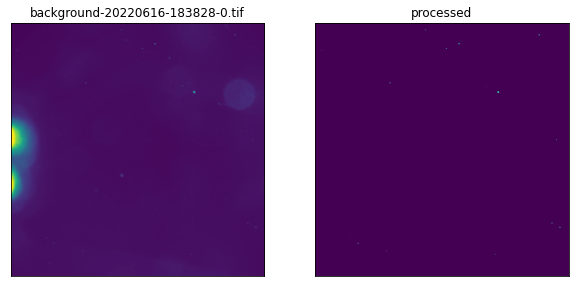

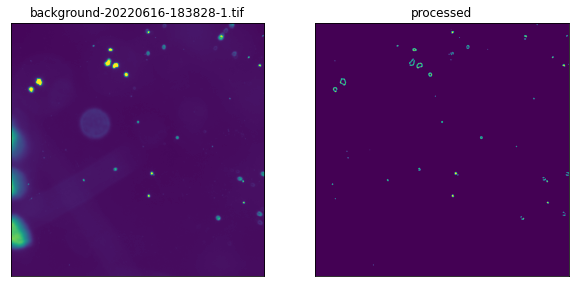

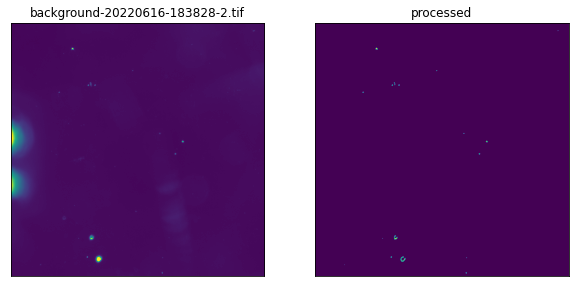

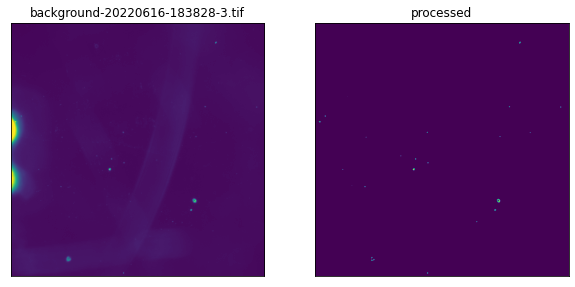

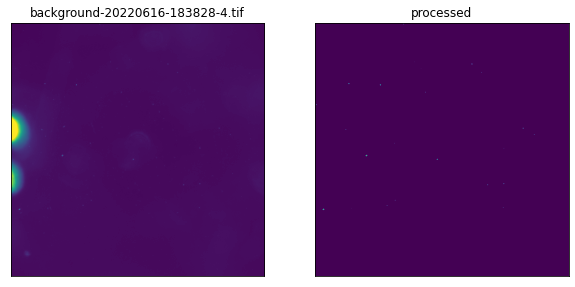

...

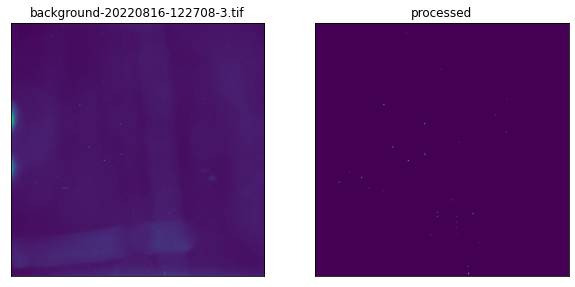

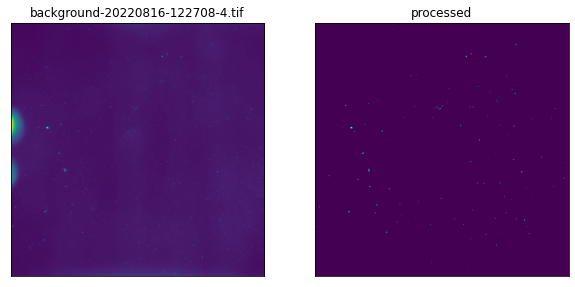

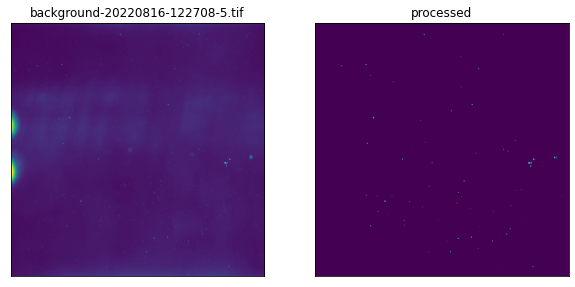

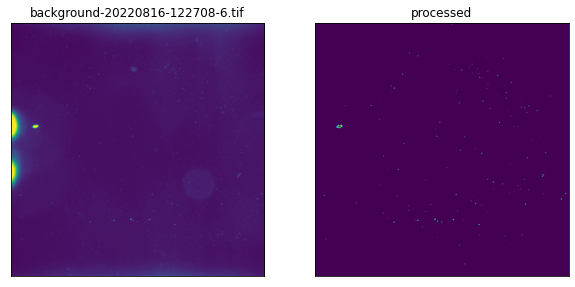

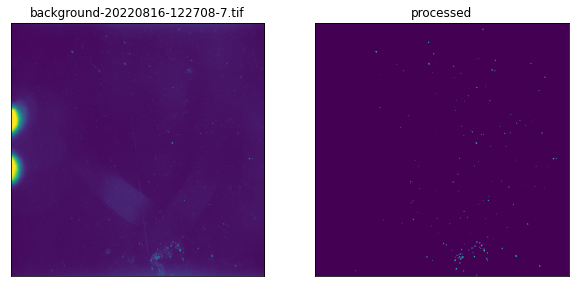

In [26]:
for fname in fnames:
    
    if fname[-6]!='-':
        continue
        
    path_cropped = base_dir + '/' + fname[:-4] + '_cropped.tif'
    path_processed = base_dir + '/' + fname[:-4] + '_processed.tif'   
    
    im_cropped = imread(path_cropped)
    im_processed = imread(path_processed)
    
    fig, axs = plt.subplots(1,2, figsize=(10,14))
    axs[0].imshow(im_cropped)
    axs[0].set_xticks([])
    axs[0].set_yticks([])
    axs[0].set_title(fname)
    
    axs[1].imshow(im_processed)
    axs[1].set_xticks([])
    axs[1].set_yticks([])
    axs[1].set_title('processed')

    plt.show()